# Explanining models

In [1]:
# Load the required packages
using SpeciesDistributionToolkit
using CairoMakie
using Statistics
CairoMakie.activate!(px_per_unit = 6.0)
import Random
Random.seed!(1234567)

Random.TaskLocalRNG()

In [2]:
# Get the polygon of interest
place = SpeciesDistributionToolkit.gadm("PRY")
extent = SpeciesDistributionToolkit.boundingbox(place)
provider = RasterData(CHELSA2, BioClim)
L = SDMLayer{Float16}[SDMLayer(provider; layer=l, extent...) for l in layers(provider)]
mask!(L, place);

In [3]:
# Get occurrence data from GBIF
tx = taxon("Akodon montensis")
presences = occurrences(tx, first(L), "occurrenceStatus" => "PRESENT", "country" => "PY", "limit" => 300, "hasCoordinate" => true)
occurrences!(presences)
println("Retrieved $(length(presences)) occurrences")

Retrieved 562 occurrences


In [4]:
# Pseudo-absence generation
presencelayer = mask(first(L), presences)
background = pseudoabsencemask(DistanceToEvent, presencelayer)
maskedbg = nodata(background, d -> d < 20)
bgpoints = backgroundpoints(maskedbg, 6sum(presencelayer))

SDM Layer with 479838 Bool cells
	Proj string: +proj=longlat +datum=WGS84 +no_defs
	Grid size: (998, 1007)

In [90]:
# Specification of the SDM
sdm = SDM(ZScore, Logistic, L, presencelayer, bgpoints)

ZScore → Logistic → P(x) ≥ 0.5

In [ ]:
# Cross-validation
folds = leaveontout(sdm);
cv = crossvalidate(sdm, folds; threshold = true);
println("""
Validation: $(round(mcc(cv.validation); digits=2)) ± $(round(ci(cv.validation); digits=2))
Training: $(round(mcc(cv.training); digits=2)) ± $(round(ci(cv.training); digits=2))
""")

Validation: 0.88 ± 0.07
Training: 0.92 ± 0.0



In [92]:
forwardselection!(sdm, folds)
cv = crossvalidate(sdm, folds; threshold = true);
println("""
Validation: $(round(mcc(cv.validation); digits=2)) ± $(round(ci(cv.validation); digits=2))
Training: $(round(mcc(cv.training); digits=2)) ± $(round(ci(cv.training); digits=2))
""")

Validation: 0.89 ± 0.06
Training: 0.93 ± 0.01



In [93]:
train!(sdm)

ZScore → Logistic → P(x) ≥ 0.426

In [94]:
vi = variableimportance(sdm, folds; threshold=false)
vi ./= sum(vi)
vnames = ["BIO$(x)" for x in variables(sdm)]
varimp = sort(collect(zip(vnames, vi)), by=(x) -> last(x), rev=true)

5-element Vector{Tuple{String, Float64}}:
 ("BIO9", 0.42383278155820764)
 ("BIO14", 0.3004000773868276)
 ("BIO4", 0.13496088148775404)
 ("BIO5", 0.09260839285565876)
 ("BIO16", 0.04819786671155192)

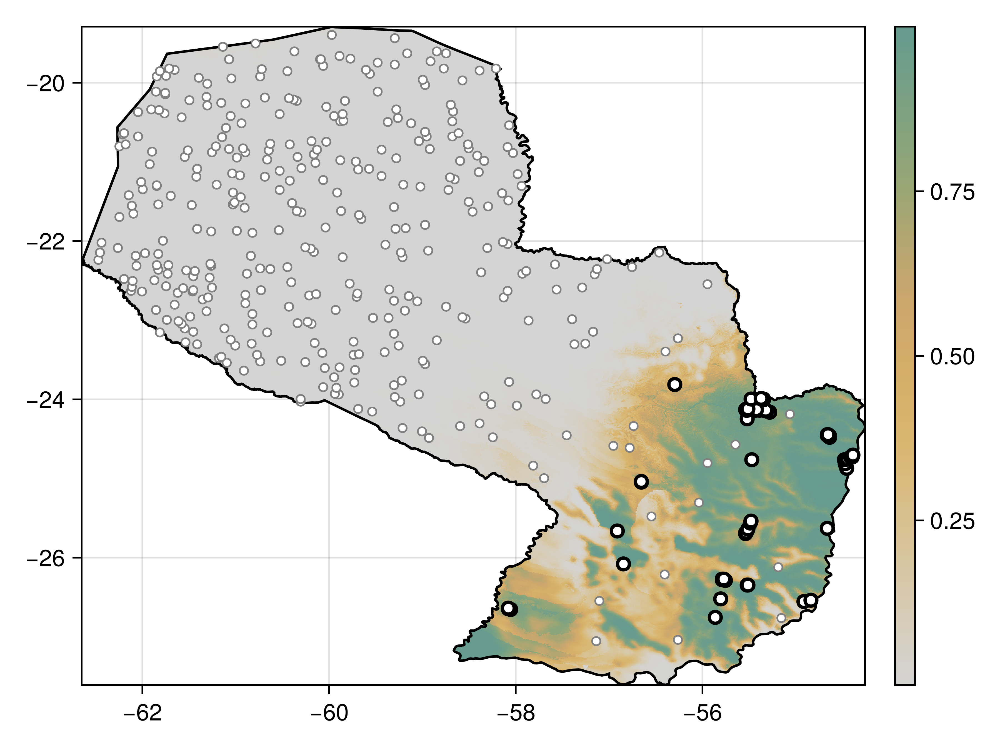

In [160]:
# Initial prediction (decision tree)
fg, ax, hm = heatmap(predict(sdm, L; threshold=false), colormap=Reverse(:linear_gow_60_85_c27_n256))
lines!(place[1].geometry, color=:black)
scatter!(presencelayer, color=:white, strokecolor=:black, strokewidth=2, markersize=10, label="Virtual presences")
scatter!(bgpoints, color=:white, strokecolor=:grey, strokewidth=1, markersize=7, label="Pseudo-absences")
Colorbar(fg[1,2], hm)
fg

In [105]:
Sall = [explain(sdm, x; threshold=false) for x in variables(sdm)]

5-element Vector{Vector{Float64}}:
 [-0.005658980297043398, 0.025778878371139947, 0.03554884015329443, 0.13375392871738195, 0.19038089487731738, 0.21610574583986375, 0.254419404095519, 0.27075369471231653, 0.22966492165801214, 0.5012079713442005  …  0.25075367016036315, 0.16933864515466382, 0.27357169969734463, 0.29994147133277066, 0.4206480194097925, 0.1277073522399797, 0.4381252325850493, 0.2311807571459554, 0.2572766989229084, 0.42084434811666105]
 [0.6226731434664542, 0.6431402172764503, 0.6548121362792917, 0.35768593189506215, 0.312035000035859, 0.261104825624403, 0.20332680193723524, 0.16183332839971612, 0.1671329434317158, 0.15544825469038706  …  0.03990981200313746, 0.24539337228637553, 0.0413866446535989, 0.20258991796636588, 0.225496848425114, 0.026929064456420022, 0.1614143589625952, 0.265688339222149, 0.17979033856793028, 0.26645808318201036]
 [-0.12225856799832649, -0.17670928117037138, -0.20245845129735432, 0.02078881047124667, -0.19866767782607975, -0.22700141435079388, 

In [108]:
Simp = [sum(abs.(S)) for S in Sall]
Simp ./= sum(Simp)
vnames = ["BIO$(x)" for x in variables(sdm)]
varimp = sort(collect(zip(vnames, Simp)), by=(x) -> last(x), rev=true)

5-element Vector{Tuple{String, Float64}}:
 ("BIO9", 0.27211112174974594)
 ("BIO4", 0.2629458121858877)
 ("BIO14", 0.21841420749319398)
 ("BIO5", 0.16313457517548216)
 ("BIO16", 0.08339428339569024)

In [133]:
v_int = 14

14

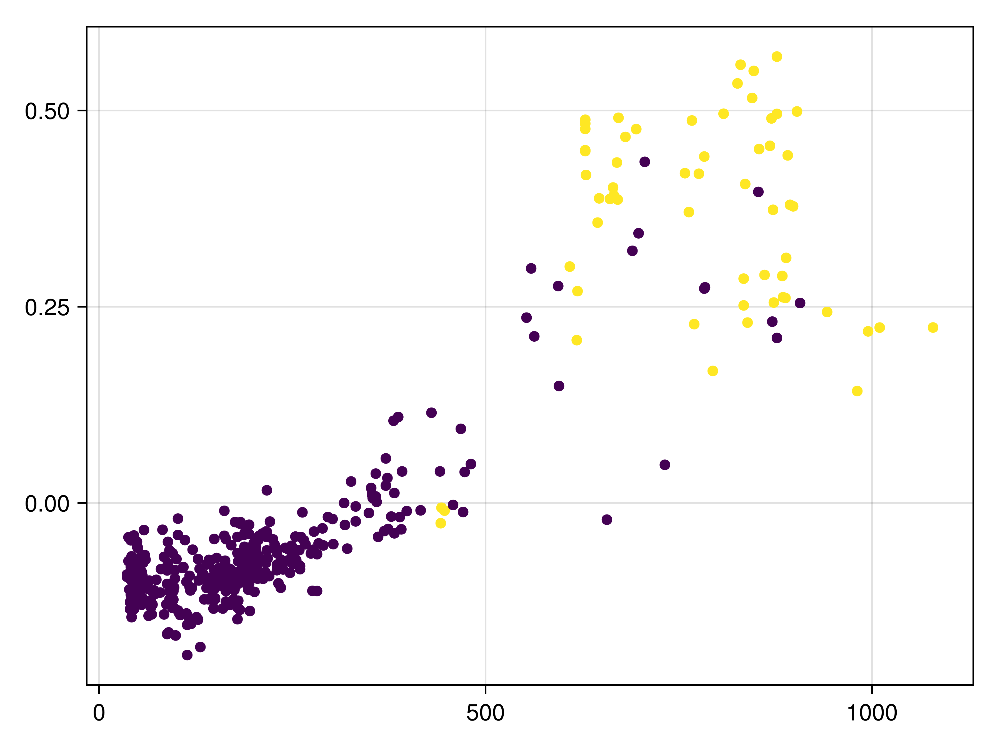

In [134]:
scatter(features(sdm, v_int), explain(sdm, v_int; threshold=false), color=labels(sdm))

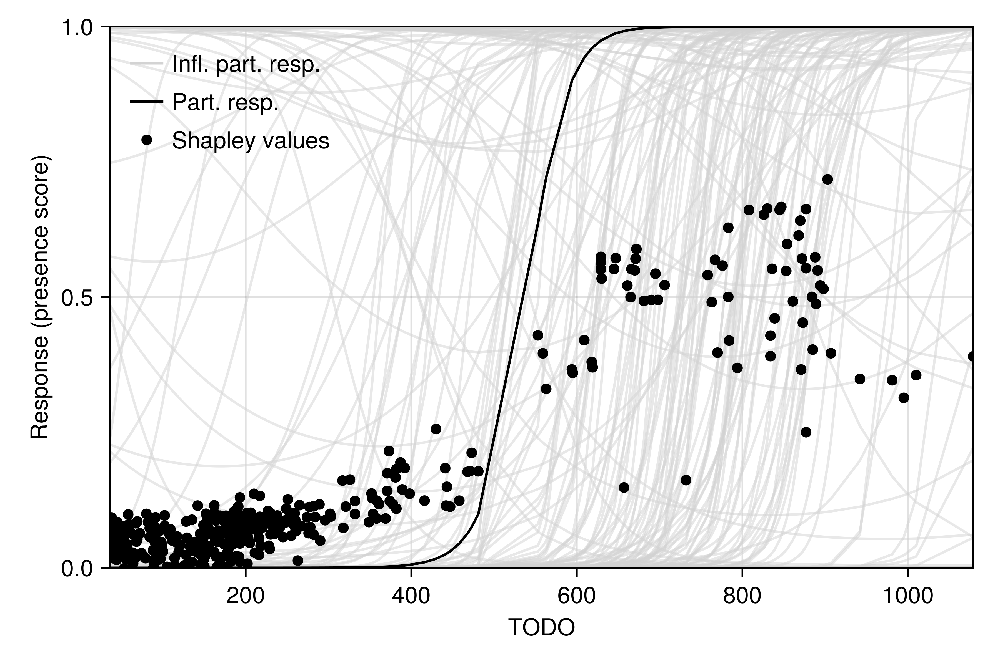

In [139]:
fig = Figure(; size = (600, 400))
ax = Axis(fig[1,1], xlabel="TODO", ylabel="Response (presence score)")
for _ in 1:200
    lines!(ax, partialresponse(sdm, v_int; threshold=false, inflated=true)..., color=:lightgrey, alpha=0.5, label="Infl. part. resp.")
end
lines!(ax, partialresponse(sdm, v_int; threshold=false)..., color=:black, label="Part. resp.")
scatter!(ax, features(sdm, v_int), explain(sdm, v_int; threshold=false) .+ mean(predict(sdm; threshold=false)), label="Shapley values", color=:black)
tightlimits!(ax)
ylims!(ax, 0, 1)
axislegend(ax, position=:lt, framevisible=false, merge=true, unique=true)
fig

In [140]:
Smap = explain(sdm, L; threshold=false)

5-element Vector{SDMLayer{Float64}}:
 SDMLayer{Float64}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], (-62.65013935825001, -54.25847272515001), (-27.60847247174999, -19.291805838349994), "+proj=longlat +datum=WGS84 +no_defs")
 SDMLayer{Float64}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], (-62.65013935825001, -54.25847272515001), (-27.60847247174999, -19.291805838349994), "+proj=longlat +datum=WGS84 +no_defs")
 SDMLayer{Float64}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Bool[0 0 … 0 0; 0 0 … 0 0; … ; 0 0 … 0 0; 0 0 … 0 0], (-62.65013935825001, -54.25847272515001), (-27.60847247174999, -19.291805838349994), "+proj=longlat +datum=WGS84 +no_defs")
 SDMLayer{Float64}([0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0; … ; 0.0 0.0 … 0.0 0.0; 0.0 0.0 … 0.0 0.0], Bool[0 0 … 0 0; 0 0 … 0 0

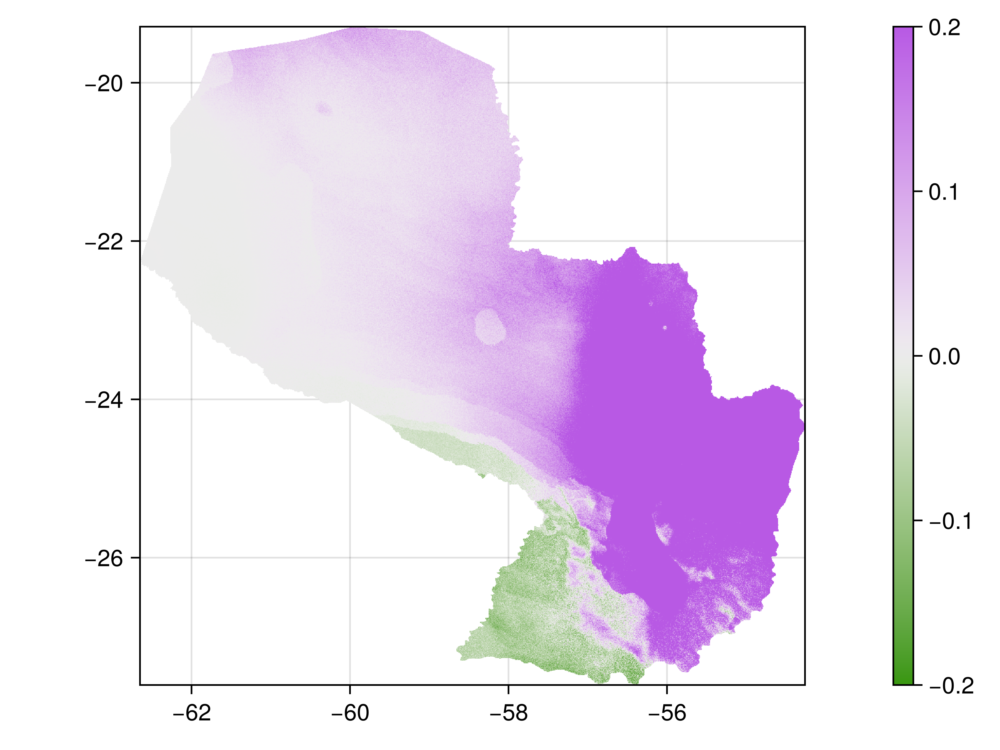

In [147]:
f = Figure()
ax = Axis(f[1,1], aspect=DataAspect())
hm = heatmap!(ax, Smap[findfirst(variables(sdm) .== v_int)], colormap=:diverging_gwv_55_95_c39_n256, colorrange=(-0.2, 0.2))
Colorbar(f[1,2], hm)
f

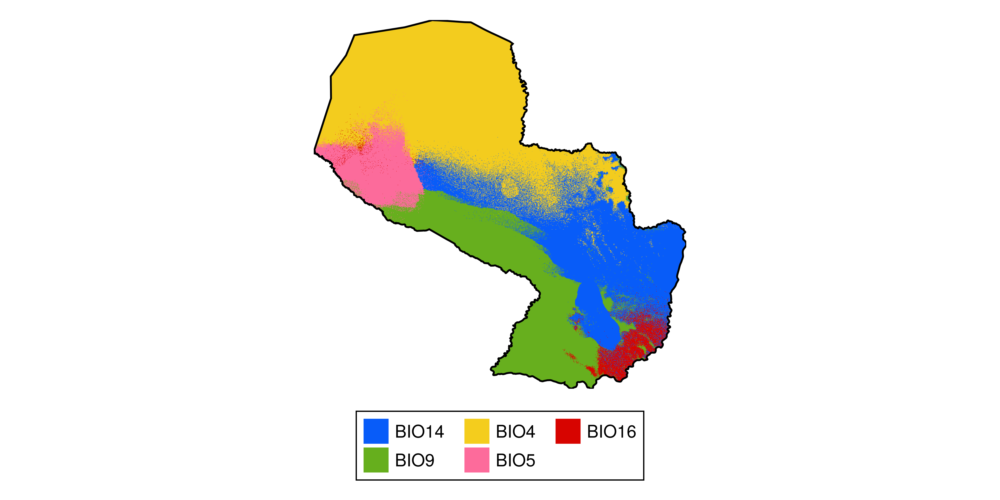

In [161]:
f = Figure(; size = (800, 400))
ax = Axis(f[1, 1]; aspect = DataAspect())
var_colors = cgrad(:diverging_rainbow_bgymr_45_85_c67_n256, length(variables(sdm)), categorical=true)
hm = heatmap!(ax, mosaic(argmax, Smap); colormap = var_colors, colorrange=(1, length(variables(sdm))))
lines!(ax, place.geometry[1]; color = :black)
hidedecorations!(ax)
hidespines!(ax)
Legend(
    f[2, 1],
    [PolyElement(; color = var_colors[i]) for i in 1:length(variables(sdm))],
    "BIO" .* string.(variables(sdm));
    orientation = :horizontal,
    nbanks = 2,
)
current_figure()

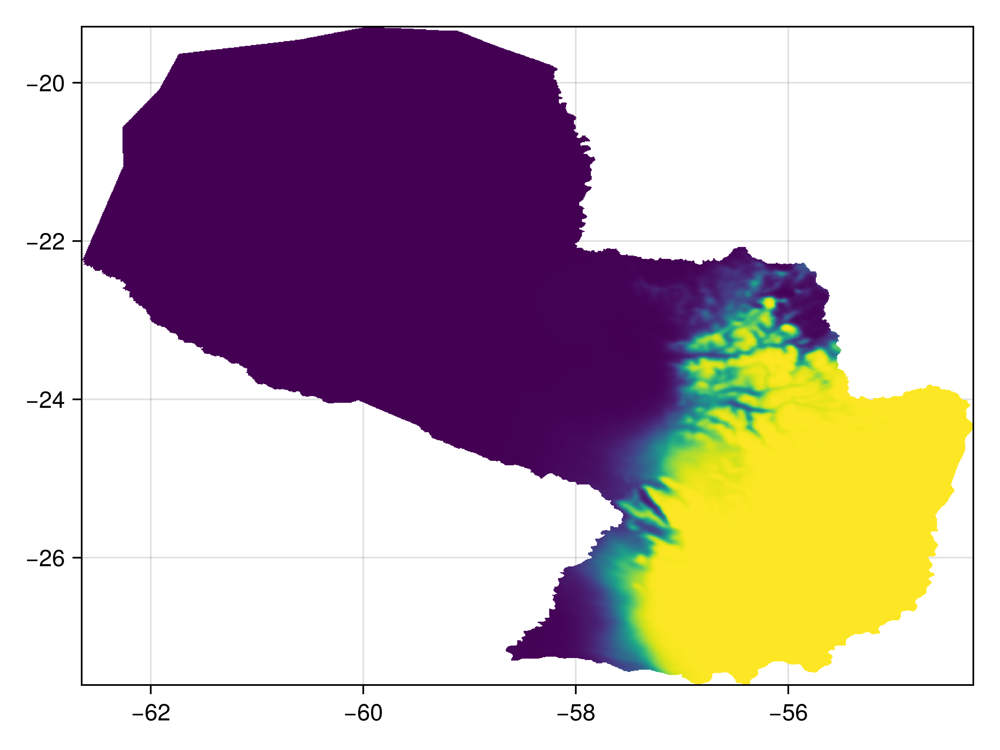

In [138]:
partialresponse(sdm, L, v_int; threshold=false) |> heatmap